In [ ]:
!pip install urllib3
!pip install spacy
!python3 -m spacy download en_core_web_sm
!pip install nltk
!pip install beautifulsoup4
!pip install textacy
!pip install feedparser
!pip install pyLDAvis
!pip uninstall pandas
!pip install pandas==1.3.4

     |████████████████████████████████| 12.0 MB 8.9 MB/s 
✔ Download and installation successful
You can now load the model via spacy.load('en_core_web_sm')
     |████████████████████████████████| 200 kB 7.7 MB/s 
     |████████████████████████████████| 132 kB 52.7 MB/s 
     |████████████████████████████████| 2.0 MB 60.1 MB/s 
     |████████████████████████████████| 6.0 MB 42.4 MB/s 
     |████████████████████████████████| 481 kB 52.4 MB/s 
     |████████████████████████████████| 628 kB 46.0 MB/s 
     |████████████████████████████████| 451 kB 57.1 MB/s 
     |████████████████████████████████| 10.1 MB 43.9 MB/s 
     |████████████████████████████████| 181 kB 58.8 MB/s 
     |████████████████████████████████| 42 kB 1.4 MB/s 
  Created wheel for cytoolz: filename=cytoolz-0.11.2-cp37-cp37m-linux_x86_64.whl size=1231128 sha256=bcf0273e6dff9c623df83114f2d32c6f153d56a29a33e8c9f8321a1d9c2d8359
  Stored in directory: /root/.cache/pip/wheels/38/70/71/ca13ea3d36ccd0b3d0ec7d7a4ca67522048d695b556

Found existing installation: pandas 1.3.5
Uninstalling pandas-1.3.5:
  Would remove:
    /usr/local/lib/python3.7/dist-packages/pandas-1.3.5.dist-info/*
    /usr/local/lib/python3.7/dist-packages/pandas/*
Proceed (y/n)? 

In [ ]:
# Suppress Warnings
import warnings
warnings.filterwarnings('ignore')

#Import the necessary packages
import pickle
import pandas as pd
import numpy as np
from datetime import datetime
import nltk
nltk.download('wordnet')
nltk.download('punkt')
nltk.download('stopwords')
nltk.download('averaged_perceptron_tagger')
from nltk.tokenize import word_tokenize
from nltk.tokenize import sent_tokenize
from nltk.stem import WordNetLemmatizer, SnowballStemmer
from nltk.corpus import stopwords
import gensim
from gensim.utils import simple_preprocess
from gensim.corpora.dictionary import Dictionary
import gensim.corpora as corpora
from gensim.models import CoherenceModel
from gensim.models.ldamodel import LdaModel
#import spacy
import string
import re
import pyLDAvis
import pyLDAvis.gensim_models
import matplotlib.pyplot as plt
import matplotlib.font_manager
from sklearn.feature_extraction.text import TfidfVectorizer

[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Unzipping corpora/wordnet.zip.
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.
[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     /root/nltk_data...
[nltk_data]   Unzipping taggers/averaged_perceptron_tagger.zip.


/usr/local/lib/python3.7/dist-packages/past/types/oldstr.py:5: DeprecationWarning: Using or importing the ABCs from 'collections' instead of from 'collections.abc' is deprecated since Python 3.3,and in 3.9 it will stop working
  from collections import Iterable


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


# New Section

In [ ]:
#Load the krebs dataset (saved as a pickle file) into a dataframe df
import pandas as pd

df = pd.read_csv("/content/drive/MyDrive/CS F366/2010-2019-dataset.csv")
df.tail()

,Authors,Author(s) ID,Title,Year,Source title,Volume,Issue,Art. No.,Page start,Page end,Page count,Cited by,DOI,Link,Abstract,Document Type,Publication Stage,Open Access,Source,EID
6674,Khan M.,57210788369;,Cybersecurity considerations for industrial Io...,2019,ISA at Montreal Symposium 2018,NaN,NaN,NaN,25,37,NaN,NaN,NaN,https://www.scopus.com/inward/record.uri?eid=2...,[No abstract available],Conference Paper,Final,NaN,Scopus,2-s2.0-85071461626
6675,[No author name available],[No author id available],IDIMT 2019: Innovation and Transformation in a...,2019,IDIMT 2019: Innovation and Transformation in a...,NaN,NaN,NaN,NaN,NaN,450.0,NaN,NaN,https://www.scopus.com/inward/record.uri?eid=2...,The proceedings contain 48 papers. The topics ...,Conference Review,Final,NaN,Scopus,2-s2.0-85071461159
6676,[No author name available],[No author id available],ISA at Montreal Symposium 2018,2019,ISA at Montreal Symposium 2018,NaN,NaN,NaN,NaN,NaN,61.0,NaN,NaN,https://www.scopus.com/inward/record.uri?eid=2...,The proceedings contain 4 papers. The topics d...,Conference Review,Final,NaN,Scopus,2-s2.0-85071453485
6677,[No author name available],[No author id available],4th International Conference on Interactive Co...,2019,Lecture Notes in Computer Science (including s...,11659 LNAI,NaN,NaN,NaN,NaN,340.0,NaN,NaN,https://www.scopus.com/inward/record.uri?eid=2...,The proceedings contain 32 papers. The special...,Conference Review,Final,NaN,Scopus,2-s2.0-85071453246
6678,Ahmad M.,57193334182;,Processors tackle cybersecurity in connected cars,2019,Electronic Products,61,7,NaN,13,15,NaN,NaN,NaN,https://www.scopus.com/inward/record.uri?eid=2...,[No abstract available],Article,Final,NaN,Scopus,2-s2.0-85071322483


In [ ]:
df = df[["Title", "Abstract","Year"]]
# df1=pd.read_csv("/content/drive/MyDrive/CS F366/2020-dataset.csv")
# df1=df1[["Title","Abstract","Year"]]
# df=df.append(df1)
# df1=pd.read_csv("/content/drive/MyDrive/CS F366/2021-dataset.csv")
# df1=df1[["Title","Abstract","Year"]]
# df=df.append(df1)
# df1.tail()

NameError: ignored

In [ ]:
#Inspect the dataframe
print(len(df.index))


6679


In [ ]:
df['Abstract']

0       Increasing complexity of power grids, growing ...
1       Although researchers have spent considerable t...
2       Disruption of electric power operations can be...
3       Existing and forthcoming devices at the reside...
4       Since 2004, the DETER Cybersecurity Testbed Pr...
                              ...                        
6674                              [No abstract available]
6675    The proceedings contain 48 papers. The topics ...
6676    The proceedings contain 4 papers. The topics d...
6677    The proceedings contain 32 papers. The special...
6678                              [No abstract available]
Name: Abstract, Length: 6679, dtype: object

In [ ]:
#Define a function that removes urls from text using regex
def remove_urls(text):
    URLess_string = re.sub(r'\w+:\/{2}[\d\w-]+(\.[\d\w-]+)*(?:(?:\/[^\s/]*))*', '', text)
    return URLess_string

In [ ]:
#Define a function that removes punctuation from the text which may impact the model's ability to extract topics
def remove_punctuation(text):
    no_punct = re.sub(r'[^\w\s]', '', text)
    return no_punct

In [ ]:
#Apply the remove url function to the body series
df['Abstract'] = df['Abstract'].apply(lambda x: remove_urls(x))

In [ ]:
#Apply the remove punctuation function to the body series
df['Abstract'] = df['Abstract'].apply(lambda x: remove_punctuation(x))

In [ ]:
print(df.head())

                                               Title  ...  Year
0        A reliability perspective of the smart grid  ...  2010
1                         Smart-grid security issues  ...  2010
2  Cybersecurity for critical infrastructures: At...  ...  2010
3  An authenticated control framework for distrib...  ...  2010
4  The DETER project: Advancing the science of cy...  ...  2010

[5 rows x 3 columns]


Improving Interpretability using n-grams:

In [ ]:
# Added on 25-11
bigram_measures = nltk.collocations.BigramAssocMeasures()
finder = nltk.collocations.BigramCollocationFinder.from_documents([comment.split() for comment in df.Abstract])
# Filter only those that occur at least 10 times
finder.apply_freq_filter(10)
bigram_scores = finder.score_ngrams(bigram_measures.pmi)

In [ ]:
# added on 25-11
trigram_measures = nltk.collocations.TrigramAssocMeasures()
finder = nltk.collocations.TrigramCollocationFinder.from_documents([comment.split() for comment in df.Abstract])
# Filter only those that occur at least 50 times
finder.apply_freq_filter(5)
trigram_scores = finder.score_ngrams(trigram_measures.pmi)


In [ ]:
bigram_pmi = pd.DataFrame(bigram_scores)
bigram_pmi.columns = ['bigram', 'pmi']
bigram_pmi.sort_values(by='pmi', axis = 0, ascending = False, inplace = True)

In [ ]:
trigram_pmi = pd.DataFrame(trigram_scores)
trigram_pmi.columns = ['trigram', 'pmi']
trigram_pmi.sort_values(by='pmi', axis = 0, ascending = False, inplace = True)

In [ ]:
# Filter for bigrams with only noun-type structures
def bigram_filter(bigram):
    tag = nltk.pos_tag(bigram)
    if tag[0][1] not in ['JJ', 'NN'] and tag[1][1] not in ['NN']:
        return False
    if bigram[0] in stopwords.words('english') or bigram[1] in stopwords.words('english'):
        return False
    if 'n' in bigram or 't' in bigram:
        return False
    if 'PRON' in bigram:
        return False
    return True

In [ ]:
def trigram_filter(trigram):
    tag = nltk.pos_tag(trigram)
    if tag[0][1] not in ['JJ', 'NN'] and tag[1][1] not in ['JJ','NN']:
        return False
    if trigram[0] in stopwords.words('english') or trigram[-1] in stopwords.words('english') or trigram[1] in stopwords.words('english'):
        return False
    if 'n' in trigram or 't' in trigram:
         return False
    if 'PRON' in trigram:
        return False
    return True 

In [ ]:
# Can set pmi threshold to whatever makes sense - eyeball through and select threshold where n-grams stop making sense
# choose top 500 ngrams in this case ranked by PMI that have noun like structures
filtered_bigram = bigram_pmi[bigram_pmi.apply(lambda bigram: bigram_filter(bigram['bigram']) and bigram.pmi > 5, axis = 1)][:500]

filtered_trigram = trigram_pmi[trigram_pmi.apply(lambda trigram: trigram_filter(trigram['trigram']) and trigram.pmi > 5, axis = 1)][:500]


bigrams = [' '.join(x) for x in filtered_bigram.bigram.values if len(x[0]) > 2 or len(x[1]) > 2]
trigrams = [' '.join(x) for x in filtered_trigram.trigram.values if len(x[0]) > 2 or len(x[1]) > 2 and len(x[2]) > 2]

In [ ]:
bigrams[:10]

['Creative Commons',
 'Inderscience Enterprises',
 'Domain Name',
 'SoftwareDefined Networking',
 'ad hoc',
 'Homomorphic Encryption',
 'Special Interest',
 'Academic Conferences',
 'Executive Order',
 'Academic Excellence']

In [ ]:
trigrams[:10]

['Latent Dirichlet Allocation',
 'Sistemas e Tecnologias',
 'Your Own Device',
 'ElectricalElectronicProgrammable Electronic Safetyrelated',
 'Long ShortTerm Memory',
 'Red TeamBlue Team',
 'Unmanned Aerial Vehicles',
 'AntiTerrorism Standards CFATS8',
 'Creative Commons License',
 'Genetic Algorithm GA']

In [ ]:
# Concatenate n-grams
def replace_ngram(x):
    for gram in trigrams:
        x = x.replace(gram, '_'.join(gram.split()))
    for gram in bigrams:
        x = x.replace(gram, '_'.join(gram.split()))
    return x

In [ ]:
reviews_w_ngrams = df.copy()

In [ ]:
reviews_w_ngrams.Abstract = reviews_w_ngrams.Abstract.map(lambda x: replace_ngram(x))

In [ ]:
# tokenize reviews + remove stop words + remove names + remove words with less than 2 characters
# english_names not implemented
reviews_w_ngrams = reviews_w_ngrams.Abstract.map(lambda x: [word for word in x.split() if word not in stopwords.words('english') and len(word) > 2 and word not in ['cybersecurity','information','security','cyber','research','paper','study','article']])

In [ ]:
reviews_w_ngrams.head()

0    [Increasing, complexity, power_grids, growing,...
1    [Although, researchers, spent, considerable, t...
2    [Disruption, electric_power, operations, catas...
3    [Existing, forthcoming, devices, residential, ...
4    [Since, 2004, DETER, Cybersecurity, Testbed, P...
Name: Abstract, dtype: object

In [ ]:
# Filter for only nouns
def noun_only(x):
    pos_comment = nltk.pos_tag(x)
    filtered = [word[0] for word in pos_comment if word[1] in ['NN']]
    # to filter both noun and verbs
    #filtered = [word[0] for word in pos_comment if word[1] in ['NN','VB', 'VBD', 'VBG', 'VBN', 'VBZ']]
    return filtered

In [ ]:
final_reviews = reviews_w_ngrams.map(noun_only)
df['Abstract']=final_reviews
# final_reviews.head()
df.head()

,Title,Abstract,Year
0,A reliability perspective of the smart grid,"[complexity, demand, requirement, reliability,...",2010
1,Smart-grid security issues,"[time, highlevel, review, authentication, encr...",2010
2,Cybersecurity for critical infrastructures: At...,"[Disruption, electric_power, economy, complexi...",2010
3,An authenticated control framework for distrib...,"[level, ability, power, support, generation, e...",2010
4,The DETER project: Advancing the science of cy...,"[infrastructure, resource, experimentation, ne...",2010


In [ ]:
#Define a function that takes input string, converts it all to lower case then tokenizes it using nltk.tokenize
def word_tokenizer(text):
    tokens = nltk.word_tokenize(text.lower())
    return tokens

In [ ]:
df.head()

,Title,Abstract,Year
0,A reliability perspective of the smart grid,"[complexity, demand, requirement, reliability,...",2010
1,Smart-grid security issues,"[time, highlevel, review, authentication, encr...",2010
2,Cybersecurity for critical infrastructures: At...,"[Disruption, electric_power, economy, complexi...",2010
3,An authenticated control framework for distrib...,"[level, ability, power, support, generation, e...",2010
4,The DETER project: Advancing the science of cy...,"[infrastructure, resource, experimentation, ne...",2010


In [ ]:
#Save the preprocessed data to a pickle file: 'df_preprocessed.pickle'
with open('df_preprocessed.pickle', 'wb') as f:
    pickle.dump(df, f)

In [ ]:
# df.index = pd.to_datetime(df.index)
#df = df.sort_index()

#df.head()

#df = df['2019-12-31':]
# print(df.size())

In [ ]:
# Create a dictionary of all unique tokens by passing df.Body to the Dictionary method
df.count
dictionary = corpora.Dictionary(df.Abstract)


In [ ]:
#Each unique token is mapped to an id number e.g. 'chip': 140
#dictionary.token2id

In [ ]:
#Turn the dictionary into a corpus (a Bag of Words) that contains the word id and its frequency in each document (article in our case)
texts = df.Abstract
corpus = [dictionary.doc2bow(text) for text in texts]

In [ ]:
# Create a dictionary of all unique tokens by passing df.Title to the Dictionary method
#dictionary_from_titles = corpora.Dictionary(df.Title)

In [ ]:
#Turn the dictionary into a corpus (a Bag of Words) that contains the word id and its frequency in each document (article in our case)
#texts_from_titles = df.Title
#corpus_from_titles = [dictionary_from_titles.doc2bow(text) for text in texts_from_titles]

In [ ]:
#Create an LDA model from the Body corpus which extracts 10 topics
lda_model = gensim.models.ldamodel.LdaModel(corpus=corpus, id2word=dictionary, num_topics=10, random_state=42, update_every=1, chunksize=1000, passes=20, iterations=400, alpha='auto', per_word_topics=True)

Streaming output truncated to the last 5000 lines.
/usr/local/lib/python3.7/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  score += np.sum(cnt * logsumexp(Elogthetad + Elogbeta[:, int(id)]) for id, cnt in doc)
/usr/local/lib/python3.7/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  score += np.sum(cnt * logsumexp(Elogthetad + Elogbeta[:, int(id)]) for id, cnt in doc)
/usr/local/lib/python3.7/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  score += np.sum(cnt

In [ ]:
lda_model.print_topics()

[(0,
  '0.029*"development" + 0.025*"technology" + 0.022*"management" + 0.015*"industry" + 0.015*"use" + 0.014*"level" + 0.012*"field" + 0.012*"knowledge" + 0.012*"engineering" + 0.012*"business"'),
 (1,
  '0.053*"privacy" + 0.037*"policy" + 0.030*"cyberspace" + 0.020*"government" + 0.017*"protection" + 0.015*"cybercrime" + 0.014*"internet" + 0.013*"role" + 0.013*"law" + 0.011*"state"'),
 (2,
  '0.103*"detection" + 0.040*"classification" + 0.032*"accuracy" + 0.024*"malware" + 0.015*"detect" + 0.014*"ransomware" + 0.014*"performance" + 0.011*"method" + 0.010*"task" + 0.010*"module"'),
 (3,
  '0.063*"system" + 0.053*"control" + 0.035*"power" + 0.034*"communication" + 0.029*"safety" + 0.020*"access" + 0.017*"energy" + 0.017*"protection" + 0.015*"operation" + 0.014*"architecture"'),
 (4,
  '0.038*"dataset" + 0.022*"manufacturing" + 0.021*"quality" + 0.020*"password" + 0.017*"aviation" + 0.014*"confidentiality" + 0.012*"money" + 0.011*"construction" + 0.011*"server" + 0.010*"resiliency"'),


In [ ]:
coherence_model_lda_body = CoherenceModel(model=lda_model, texts=df.Abstract, dictionary=dictionary, coherence='c_v')
coherence_lda_body = coherence_model_lda_body.get_coherence()
print('\nCoherence score from Body: ', coherence_lda_body)


Coherence score from Body:  0.4559916026347919


In [ ]:
def compute_coherence_values(dictionary, corpus, texts, limit, start=2, step=3):
    coherence_values = []
    model_list = []
    for num_topics in range(start, limit, step):
        model = gensim.models.ldamodel.LdaModel(corpus=corpus, id2word=dictionary, num_topics=num_topics, random_state=42, update_every=1, chunksize=1000, passes=20, iterations=400, alpha='auto', per_word_topics=True)
        model_list.append(model)
        coherence_model = CoherenceModel(model=model, texts=texts, dictionary=dictionary, coherence='c_v')
        coherence_values.append(coherence_model.get_coherence())
        
    return model_list, coherence_values

In [ ]:
model_list, coherence_values = compute_coherence_values(dictionary=dictionary, corpus=corpus, texts=df.Abstract, limit=30, start=2, step=2)

Streaming output truncated to the last 5000 lines.
/usr/local/lib/python3.7/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  score += np.sum(cnt * logsumexp(Elogthetad + Elogbeta[:, int(id)]) for id, cnt in doc)
/usr/local/lib/python3.7/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  score += np.sum(cnt * logsumexp(Elogthetad + Elogbeta[:, int(id)]) for id, cnt in doc)
/usr/local/lib/python3.7/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  score += np.sum(cnt

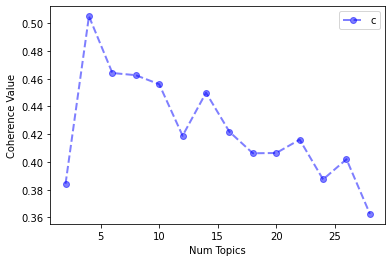

<Figure size 432x288 with 0 Axes>

In [ ]:
limit=30; start=2; step=2;
x = range(start, limit, step)
plt.plot(x, coherence_values, 'bo--', linewidth=2, markersize=6, alpha=0.5)
plt.xlabel("Num Topics")
plt.ylabel("Coherence Value")
plt.legend(("coherence_values"), loc='best')
#plt.title('Coherence Value as a function of topic numbers\n from Krebsonsecurity Title Corpus')
plt.show()
plt.savefig('Coherence_values')

In [ ]:
 for m, cv in zip(x, coherence_values):
    print('Num Topics =', m, 'has Coherence ValueErrorlue of', round(cv,4))

Num Topics = 2 has Coherence ValueErrorlue of 0.3843
Num Topics = 4 has Coherence ValueErrorlue of 0.505
Num Topics = 6 has Coherence ValueErrorlue of 0.4641
Num Topics = 8 has Coherence ValueErrorlue of 0.4625
Num Topics = 10 has Coherence ValueErrorlue of 0.456
Num Topics = 12 has Coherence ValueErrorlue of 0.4189
Num Topics = 14 has Coherence ValueErrorlue of 0.4499
Num Topics = 16 has Coherence ValueErrorlue of 0.4217
Num Topics = 18 has Coherence ValueErrorlue of 0.4062
Num Topics = 20 has Coherence ValueErrorlue of 0.4064
Num Topics = 22 has Coherence ValueErrorlue of 0.4161
Num Topics = 24 has Coherence ValueErrorlue of 0.3874
Num Topics = 26 has Coherence ValueErrorlue of 0.4019
Num Topics = 28 has Coherence ValueErrorlue of 0.3625


Streaming output truncated to the last 5000 lines.
/usr/local/lib/python3.7/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  score += np.sum(cnt * logsumexp(Elogthetad + Elogbeta[:, int(id)]) for id, cnt in doc)
/usr/local/lib/python3.7/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  score += np.sum(cnt * logsumexp(Elogthetad + Elogbeta[:, int(id)]) for id, cnt in doc)
/usr/local/lib/python3.7/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  score += np.sum(cnt

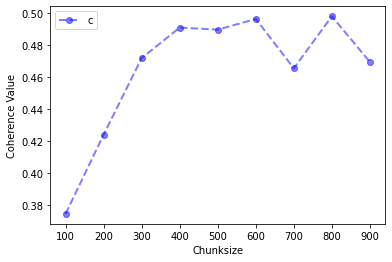

Chunksize = 100 has Coherence ValueErrorlue of 0.3742
Chunksize = 200 has Coherence ValueErrorlue of 0.4237
Chunksize = 300 has Coherence ValueErrorlue of 0.4716
Chunksize = 400 has Coherence ValueErrorlue of 0.4907
Chunksize = 500 has Coherence ValueErrorlue of 0.4894
Chunksize = 600 has Coherence ValueErrorlue of 0.4961
Chunksize = 700 has Coherence ValueErrorlue of 0.4653
Chunksize = 800 has Coherence ValueErrorlue of 0.4978
Chunksize = 900 has Coherence ValueErrorlue of 0.4692


<Figure size 432x288 with 0 Axes>

In [ ]:
# Chunksize
def compute_coherence_values_chunksize(dictionary, corpus, texts, limit, start=2, step=3):
    coherence_values = []
    model_list = []
    for chunksize in range(start, limit, step):
        model = gensim.models.ldamodel.LdaModel(corpus=corpus, id2word=dictionary, num_topics=5, random_state=42, update_every=1, chunksize=chunksize, passes=20, iterations=400, alpha='auto', per_word_topics=True)
        model_list.append(model)
        coherence_model = CoherenceModel(model=model, texts=texts, dictionary=dictionary, coherence='c_v')
        coherence_values.append(coherence_model.get_coherence())
        
    return model_list, coherence_values
model_list, coherence_values = compute_coherence_values_chunksize(dictionary=dictionary, corpus=corpus, texts=df.Abstract, limit=1000, start=100, step=100)
limit=1000; start=100; step=100;
x = range(start, limit, step)
plt.plot(x, coherence_values, 'bo--', linewidth=2, markersize=6, alpha=0.5)
plt.xlabel("Chunksize")
plt.ylabel("Coherence Value")
plt.legend(("coherence_values"), loc='best')
#plt.title('Coherence Value as a function of topic numbers\n from Krebsonsecurity Title Corpus')
plt.show()
plt.savefig('Coherence_values')
for m, cv in zip(x, coherence_values):
  print('Chunksize =', m, 'has Coherence ValueErrorlue of', round(cv,4))

Streaming output truncated to the last 5000 lines.
/usr/local/lib/python3.7/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  score += np.sum(cnt * logsumexp(Elogthetad + Elogbeta[:, int(id)]) for id, cnt in doc)
/usr/local/lib/python3.7/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  score += np.sum(cnt * logsumexp(Elogthetad + Elogbeta[:, int(id)]) for id, cnt in doc)
/usr/local/lib/python3.7/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  score += np.sum(cnt

10


Streaming output truncated to the last 5000 lines.
/usr/local/lib/python3.7/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  score += np.sum(cnt * logsumexp(Elogthetad + Elogbeta[:, int(id)]) for id, cnt in doc)
/usr/local/lib/python3.7/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  score += np.sum(cnt * logsumexp(Elogthetad + Elogbeta[:, int(id)]) for id, cnt in doc)
/usr/local/lib/python3.7/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  score += np.sum(cnt

30


Streaming output truncated to the last 5000 lines.
/usr/local/lib/python3.7/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  score += np.sum(cnt * logsumexp(Elogthetad + Elogbeta[:, int(id)]) for id, cnt in doc)
/usr/local/lib/python3.7/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  score += np.sum(cnt * logsumexp(Elogthetad + Elogbeta[:, int(id)]) for id, cnt in doc)
/usr/local/lib/python3.7/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  score += np.sum(cnt

50


Streaming output truncated to the last 5000 lines.
/usr/local/lib/python3.7/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  score += np.sum(cnt * logsumexp(Elogthetad + Elogbeta[:, int(id)]) for id, cnt in doc)
/usr/local/lib/python3.7/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  score += np.sum(cnt * logsumexp(Elogthetad + Elogbeta[:, int(id)]) for id, cnt in doc)
/usr/local/lib/python3.7/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  score += np.sum(cnt

70


Streaming output truncated to the last 5000 lines.
/usr/local/lib/python3.7/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  score += np.sum(cnt * logsumexp(Elogthetad + Elogbeta[:, int(id)]) for id, cnt in doc)
/usr/local/lib/python3.7/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  score += np.sum(cnt * logsumexp(Elogthetad + Elogbeta[:, int(id)]) for id, cnt in doc)
/usr/local/lib/python3.7/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  score += np.sum(cnt

90


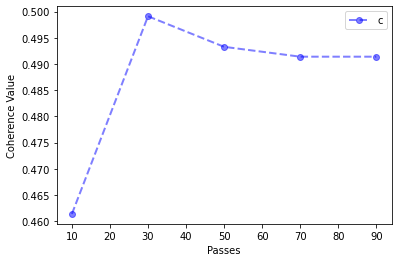

Passes = 10 has Coherence ValueErrorlue of 0.4614
Passes = 30 has Coherence ValueErrorlue of 0.4991
Passes = 50 has Coherence ValueErrorlue of 0.4933
Passes = 70 has Coherence ValueErrorlue of 0.4914
Passes = 90 has Coherence ValueErrorlue of 0.4914


<Figure size 432x288 with 0 Axes>

In [ ]:
# Passes
def compute_coherence_values_passes(dictionary, corpus, texts, limit, start=2, step=3):
    coherence_values = []
    model_list = []
    for passes in range(start, limit, step):
        model = gensim.models.ldamodel.LdaModel(corpus=corpus, id2word=dictionary, num_topics=5, random_state=42, update_every=1, chunksize=800, passes=passes, iterations=400, alpha='auto', per_word_topics=True)
        model_list.append(model)
        coherence_model = CoherenceModel(model=model, texts=texts, dictionary=dictionary, coherence='c_v')
        coherence_values.append(coherence_model.get_coherence())
        print(passes)
    return model_list, coherence_values
model_list, coherence_values = compute_coherence_values_passes(dictionary=dictionary, corpus=corpus, texts=df.Abstract, limit=100, start=10, step=20)
limit=100; start=10; step=20;
x = range(start, limit, step)
plt.plot(x, coherence_values, 'bo--', linewidth=2, markersize=6, alpha=0.5)
plt.xlabel("Passes")
plt.ylabel("Coherence Value")
plt.legend(("coherence_values"), loc='best')
#plt.title('Coherence Value as a function of topic numbers\n from Krebsonsecurity Title Corpus')
plt.show()
plt.savefig('Coherence_values')
for m, cv in zip(x, coherence_values):
  print('Passes =', m, 'has Coherence ValueErrorlue of', round(cv,4))

Streaming output truncated to the last 5000 lines.
/usr/local/lib/python3.7/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  score += np.sum(cnt * logsumexp(Elogthetad + Elogbeta[:, int(id)]) for id, cnt in doc)
/usr/local/lib/python3.7/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  score += np.sum(cnt * logsumexp(Elogthetad + Elogbeta[:, int(id)]) for id, cnt in doc)
/usr/local/lib/python3.7/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  score += np.sum(cnt

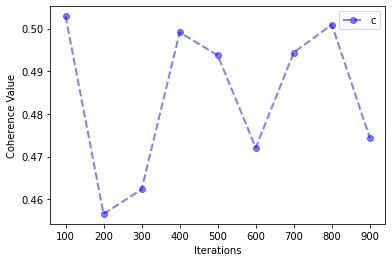

Iterations = 100 has Coherence ValueErrorlue of 0.5029
Iterations = 200 has Coherence ValueErrorlue of 0.4566
Iterations = 300 has Coherence ValueErrorlue of 0.4623
Iterations = 400 has Coherence ValueErrorlue of 0.4991
Iterations = 500 has Coherence ValueErrorlue of 0.4937
Iterations = 600 has Coherence ValueErrorlue of 0.4721
Iterations = 700 has Coherence ValueErrorlue of 0.4944
Iterations = 800 has Coherence ValueErrorlue of 0.5009
Iterations = 900 has Coherence ValueErrorlue of 0.4743


<Figure size 432x288 with 0 Axes>

In [ ]:
# Iterations-------Chunksize=800, passes=30
def compute_coherence_values_Iterations(dictionary, corpus, texts, limit, start=2, step=3):
    coherence_values = []
    model_list = []
    for iterations in range(start, limit, step):
        model = gensim.models.ldamodel.LdaModel(corpus=corpus, id2word=dictionary, num_topics=5, random_state=42, update_every=1, chunksize=800, passes=30, iterations=iterations, alpha='auto', per_word_topics=True)
        model_list.append(model)
        coherence_model = CoherenceModel(model=model, texts=texts, dictionary=dictionary, coherence='c_v')
        coherence_values.append(coherence_model.get_coherence())
        
    return model_list, coherence_values
model_list, coherence_values = compute_coherence_values_Iterations(dictionary=dictionary, corpus=corpus, texts=df.Abstract, limit=1000, start=100, step=100)
limit=1000; start=100; step=100;
x = range(start, limit, step)
plt.plot(x, coherence_values, 'bo--', linewidth=2, markersize=6, alpha=0.5)
plt.xlabel("Iterations")
plt.ylabel("Coherence Value")
plt.legend(("coherence_values"), loc='best')
#plt.title('Coherence Value as a function of topic numbers\n from Krebsonsecurity Title Corpus')
plt.show()
plt.savefig('Coherence_values')
for m, cv in zip(x, coherence_values):
  print('Iterations =', m, 'has Coherence ValueErrorlue of', round(cv,4))

Streaming output truncated to the last 5000 lines.
/usr/local/lib/python3.7/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  score += np.sum(cnt * logsumexp(Elogthetad + Elogbeta[:, int(id)]) for id, cnt in doc)
/usr/local/lib/python3.7/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  score += np.sum(cnt * logsumexp(Elogthetad + Elogbeta[:, int(id)]) for id, cnt in doc)
/usr/local/lib/python3.7/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  score += np.sum(cnt

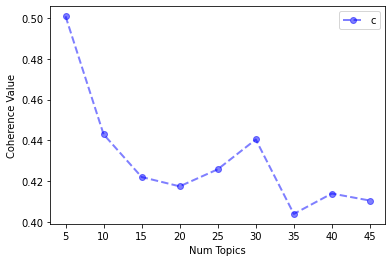

<Figure size 432x288 with 0 Axes>

In [ ]:
# Final optimized value chunksize=800 passes=30 iterations=800
def compute_coherence_values_final(dictionary, corpus, texts, limit, start=2, step=3):
    coherence_values = []
    model_list = []
    for num_topics in range(start, limit, step):
        model = gensim.models.ldamodel.LdaModel(corpus=corpus, id2word=dictionary, num_topics=num_topics, random_state=42, update_every=1, chunksize=800, passes=30, iterations=800, alpha='auto', per_word_topics=True)
        model_list.append(model)
        coherence_model = CoherenceModel(model=model, texts=texts, dictionary=dictionary, coherence='c_v')
        coherence_values.append(coherence_model.get_coherence())
        # print(passes)
    return model_list, coherence_values
model_list, coherence_values = compute_coherence_values_final(dictionary=dictionary, corpus=corpus, texts=df.Abstract, limit=50, start=5, step=5)
limit=50; start=5; step=5;
x = range(start, limit, step)
plt.plot(x, coherence_values, 'bo--', linewidth=2, markersize=6, alpha=0.5)
plt.xlabel("Num Topics")
plt.ylabel("Coherence Value")
plt.legend(("coherence_values"), loc='best')
#plt.title('Coherence Value as a function of topic numbers\n from Krebsonsecurity Title Corpus')
plt.show()
plt.savefig('Coherence_values')

In [ ]:
lda_model = gensim.models.ldamodel.LdaModel(corpus=corpus, id2word=dictionary, num_topics=10, random_state=42, update_every=1, chunksize=800, passes=30,iterations=800, alpha='auto', per_word_topics=True)
lda_model.print_topics()

Streaming output truncated to the last 5000 lines.
/usr/local/lib/python3.7/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  score += np.sum(cnt * logsumexp(Elogthetad + Elogbeta[:, int(id)]) for id, cnt in doc)
/usr/local/lib/python3.7/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  score += np.sum(cnt * logsumexp(Elogthetad + Elogbeta[:, int(id)]) for id, cnt in doc)
/usr/local/lib/python3.7/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  score += np.sum(cnt

[(0,
  '0.039*"technology" + 0.032*"management" + 0.022*"industry" + 0.017*"level" + 0.016*"development" + 0.016*"business" + 0.016*"infrastructure" + 0.015*"world" + 0.012*"space" + 0.011*"protection"'),
 (1,
  '0.061*"privacy" + 0.049*"policy" + 0.032*"cyberspace" + 0.017*"cybercrime" + 0.017*"governance" + 0.016*"internet" + 0.014*"law" + 0.013*"consumer" + 0.011*"legislation" + 0.010*"relationship"'),
 (2,
  '0.116*"detection" + 0.046*"classification" + 0.045*"malware" + 0.023*"accuracy" + 0.018*"feature" + 0.017*"detect" + 0.014*"anomaly_detection" + 0.014*"module" + 0.013*"memory" + 0.012*"computation"'),
 (3,
  '0.064*"system" + 0.056*"control" + 0.038*"power" + 0.036*"communication" + 0.026*"access" + 0.018*"secure" + 0.018*"energy" + 0.017*"architecture" + 0.016*"operation" + 0.014*"authentication"'),
 (4,
  '0.103*"network" + 0.062*"traffic" + 0.028*"technique" + 0.025*"dataset" + 0.023*"intrusion_detection" + 0.023*"graph" + 0.017*"ransomware" + 0.017*"intrusion" + 0.014*"ac

In [ ]:
pyLDAvis.enable_notebook()
vis = pyLDAvis.gensim_models.prepare(lda_model, corpus, dictionary)
vis

PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
7     -0.265945  0.118419       1        1  27.373282
0     -0.243779 -0.156341       2        1  19.849936
8     -0.138003 -0.172058       3        1  13.576435
3     -0.120921  0.283755       4        1  12.726686
1      0.027893 -0.184673       5        1   7.116673
9      0.144880  0.056870       6        1   6.075707
2      0.168277  0.034033       7        1   3.870667
4      0.088857  0.102271       8        1   3.784952
5      0.157243 -0.040313       9        1   3.669574
6      0.181497 -0.041962      10        1   1.956087, topic_info=           Term         Freq        Total Category  logprob  loglift
135     network  1814.000000  1814.000000  Default  30.0000  30.0000
48       system  3093.000000  3093.000000  Default  29.0000  29.0000
256    software  1051.000000  1051.000000  Default  28.0000  28.0000
3       control  1146.000000  1146.000000  Default  27.0000  27.0000
176   detection   722.000000   722.000000  Default  26.0000  26.0000
...         ...          ...          ...      ...      ...      ...
1266    quantum    12.493547    13.317650  Topic10  -5.5206   3.8703
409    learning    67.098774   103.195914  Topic10  -3.8396   3.5038
1043        age    23.023055    71.207339  Topic10  -4.9093   2.8051
3524     repair    13.396116    18.495870  Topic10  -5.4508   3.6116
675       video    13.214110    32.589823  Topic10  -5.4645   3.0315

[462 rows x 6 columns], token_table=      Topic      Freq           Term
term                                
1502      5  0.111979  Cybersecurity
1502      6  0.879838  Cybersecurity
235       4  0.899816         access
235       5  0.098843         access
217       7  0.627913       accuracy
...     ...       ...            ...
173       3  0.430887           work
836       3  0.994679      workforce
1364     10  0.971571       workshop
234       2  0.990979          world
234       5  0.008599          world

[601 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[8, 1, 9, 4, 2, 10, 3, 5, 6, 7])

In [ ]:
#Save the lda model from body to a pickle file
with open('lda_body.pickle', 'wb') as f:
    pickle.dump(lda_model, f)

In [ ]:
# Sentence Coloring of N Sentences
print(corpus)
def topics_per_document(model, corpus, start=0, end=1):
    corpus_sel = corpus[start:end]
    dominant_topics = []
    topic_percentages = []
    for i, corp in enumerate(corpus_sel):
        topic_percs, wordid_topics, wordid_phivalues = model[corp]
        # print(model[corp])
        dominant_topic = sorted(topic_percs, key = lambda x: x[1], reverse=True)[0][0]
        dominant_topics.append((i, dominant_topic))
        topic_percentages.append(topic_percs)
    return(dominant_topics, topic_percentages)

dominant_topics, topic_percentages = topics_per_document(model=lda_model, corpus=corpus, end=-1)            

# Distribution of Dominant Topics in Each Document
df = pd.DataFrame(dominant_topics, columns=['Document_Id', 'Dominant_Topic'])
# df_pre=df.iloc[:6679,:]
# df_post=df.iloc[6679:,:]
# print(df_pre)
# print(df_post)

# #Original
dominant_topic_in_each_doc = df.groupby('Dominant_Topic').size()
df_dominant_topic_in_each_doc= dominant_topic_in_each_doc.to_frame(name='count').reset_index()

# # Pre-covid dominant topic distribution
# dominant_topic_in_each_doc_pre = df_pre.groupby('Dominant_Topic').size()
# df_dominant_topic_in_each_doc_pre= dominant_topic_in_each_doc_pre.to_frame(name='count').reset_index()

# # Post-covid dominant topic distribution
# dominant_topic_in_each_doc_post = df_post.groupby('Dominant_Topic').size()
# df_dominant_topic_in_each_doc_post= dominant_topic_in_each_doc_post.to_frame(name='count').reset_index()

# # Total Topic Distribution by actual weight Original
topic_weightage_by_doc = pd.DataFrame([dict(t) for t in topic_percentages])
print(topic_weightage_by_doc)
# topic_weightage_by_doc.to_csv('demo.csv')
df_topic_weightage_by_doc = topic_weightage_by_doc.sum().to_frame(name='count').reset_index()

# Pre-covid total topic distribution by actual weight
# topic_weightage_by_doc_pre = topic_weightage_by_doc.iloc[:6679,:]
# topic_weightage_by_doc_post=topic_weightage_by_doc.iloc[6679:,:]
# # print(topic_weightage_by_doc.head())
# # topic_weightage_by_doc.to_csv('demo.csv')
# df_topic_weightage_by_doc_pre = topic_weightage_by_doc_pre.sum().to_frame(name='count').reset_index()
# df_topic_weightage_by_doc_post=topic_weightage_by_doc_post.sum().to_frame(name='count').reset_index()

# Top 3 Keywords for each Topic
topic_top3words = [(i, topic) for i, topics in lda_model.show_topics(formatted=False) 
                                 for j, (topic, wt) in enumerate(topics) if j < 3]

df_top3words_stacked = pd.DataFrame(topic_top3words, columns=['topic_id', 'words'])
df_top3words = df_top3words_stacked.groupby('topic_id').agg(', \n'.join)
df_top3words.reset_index(level=0,inplace=True)

[[(0, 1), (1, 1), (2, 1), (3, 1), (4, 1), (5, 2), (6, 1), (7, 1), (8, 2), (9, 1), (10, 1), (11, 1), (12, 1), (13, 1), (14, 3), (15, 1), (16, 1), (17, 1), (18, 1), (19, 1), (20, 1)], [(20, 1), (21, 1), (22, 1), (23, 1), (24, 1)], [(1, 1), (2, 1), (3, 4), (8, 2), (12, 1), (13, 1), (25, 1), (26, 1), (27, 2), (28, 1), (29, 2), (30, 1), (31, 1), (32, 1), (33, 1), (34, 1), (35, 1), (36, 2), (37, 1), (38, 1), (39, 1), (40, 1), (41, 1), (42, 1), (43, 3), (44, 1), (45, 1), (46, 1), (47, 1), (48, 3), (49, 2)], [(0, 1), (11, 1), (43, 4), (48, 3), (50, 1), (51, 1), (52, 1), (53, 1), (54, 1), (55, 1), (56, 1), (57, 1), (58, 3), (59, 1), (60, 1), (61, 1)], [(2, 1), (41, 1), (62, 1), (63, 1), (64, 1), (65, 1), (66, 1), (67, 1), (68, 1), (69, 1), (70, 1)], [(71, 1), (72, 1), (73, 1), (74, 3), (75, 1), (76, 1), (77, 1), (78, 1), (79, 1), (80, 2), (81, 1), (82, 1), (83, 1), (84, 1), (85, 1), (86, 1), (87, 1), (88, 1), (89, 1)], [(3, 2), (48, 1), (49, 1), (56, 1), (86, 2), (88, 1), (90, 1), (91, 1), (92,

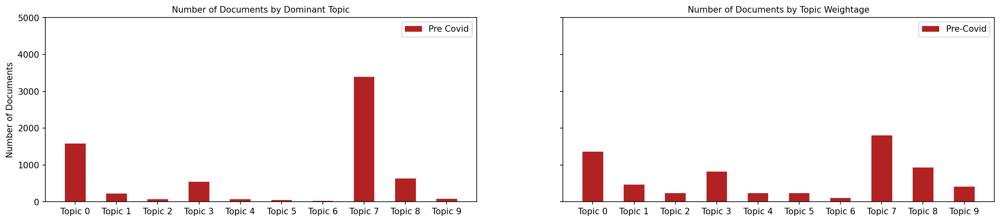

In [ ]:
# Plot
from matplotlib.ticker import FuncFormatter
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 4), dpi=150, sharey=True)

# Topic Distribution by Dominant Topics

# print(df_dominant_topic_in_each_doc_post)
# print(df_dominant_topic_in_each_doc_pre)
# num1=list(df_dominant_topic_in_each_doc_pre.index)
# num2=list(df_dominant_topic_in_each_doc_post.index)
# print(num1)
# j=0
# for i in df_dominant_topic_in_each_doc_pre['count']:
#   df_dominant_topic_in_each_doc_pre['count'][j]=(int(i)/6679)*100
#   j=j+1
# j=0
# for i in df_dominant_topic_in_each_doc_post['count']:
#   df_dominant_topic_in_each_doc_post['count'][j]=(int(i)/3999)*100
#   j=j+1
# print(df_dominant_topic_in_each_doc_pre)
# print(df_dominant_topic_in_each_doc_post)
ax1.bar(x='Dominant_Topic', height='count', data=df_dominant_topic_in_each_doc, width=.5, color='firebrick',label="Pre Covid")
# ax1.bar(x='Dominant_Topic', height='count', data=df_dominant_topic_in_each_doc_post,width=.5, color='steelblue',label="Post-Covid")
ax1.legend()
ax1.set_xticks(range(df_dominant_topic_in_each_doc.Dominant_Topic.unique().__len__()))
# print(df_top3words.loc[df_top3words.topic_id==x, 'words'])
tick_formatter = FuncFormatter(lambda x, pos: 'Topic ' + str(x))#+ '\n'+ df_top3words.loc[df_top3words.topic_id==x, 'words'].values[0])
print(tick_formatter)
ax1.xaxis.set_major_formatter(tick_formatter)
ax1.set_title('Number of Documents by Dominant Topic', fontdict=dict(size=10))
ax1.set_ylabel('Number of Documents')
ax1.set_ylim(0, 5000)

# Topic Distribution by Topic Weights
ax2.bar(x='index', height='count', data=df_topic_weightage_by_doc, width=.5, color='firebrick',label="Pre-Covid")
# ax2.bar(x='index', height='count', data=df_topic_weightage_by_doc_post, width=.5, color='steelblue',label="Post-Covid")
ax2.legend()
ax2.set_xticks(range(df_topic_weightage_by_doc.index.unique().__len__()))
ax2.xaxis.set_major_formatter(tick_formatter)
ax2.set_title('Number of Documents by Topic Weightage', fontdict=dict(size=10))

plt.show()

In [2]:
#  Topic wise trend analysis across years
numTopics=10
years=9
year=[2010,2011,2012,2013,2014,2015,2016,2017,2018]
arr=[107,141,168,229,305,504,1735,1030,1461]
j = 1
while j<years:
  arr[j]=arr[j]+arr[j-1]
  # print(j)
  j=j+1
print(arr)
freq=[[0]*years for _ in range(numTopics)]
j=0
# print(df)
s=[0]*numTopics
for (i,j) in zip(df['Dominant_Topic'],df['Document_Id']) :
  s[i]+=1
  # print(type(i))
  if j<arr[0]:
    freq[i][0]+=1
  elif j<arr[1]:
    freq[i][1]+=1
  elif j<arr[2]:
    freq[i][2]+=1
  elif j<arr[3]:
    freq[i][3]+=1
  elif j<arr[4]:
    freq[i][4]+=1
  elif j<arr[5]:
    freq[i][5]+=1
  elif j<arr[6]:
    freq[i][6]+=1
  elif j<arr[7]:
    freq[i][7]+=1
  elif j<arr[8]:
    freq[i][8]+=1

print(freq)
print(s)
for i in range(10):
  plt.plot(year,[(k/j)*100 for (k,j) in zip(freq[i],arr)],color='blue',marker='o',markersize=10,label='Topic '+str(i))
  plt.legend()
  plt.show()


[107, 248, 416, 645, 950, 1454, 3189, 4219, 5680]


NameError: ignored